In [1]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from PIL import Image
from IPython.display import display

import os, random

from perceptual.filterbank import Steerable, visualize
import cv2

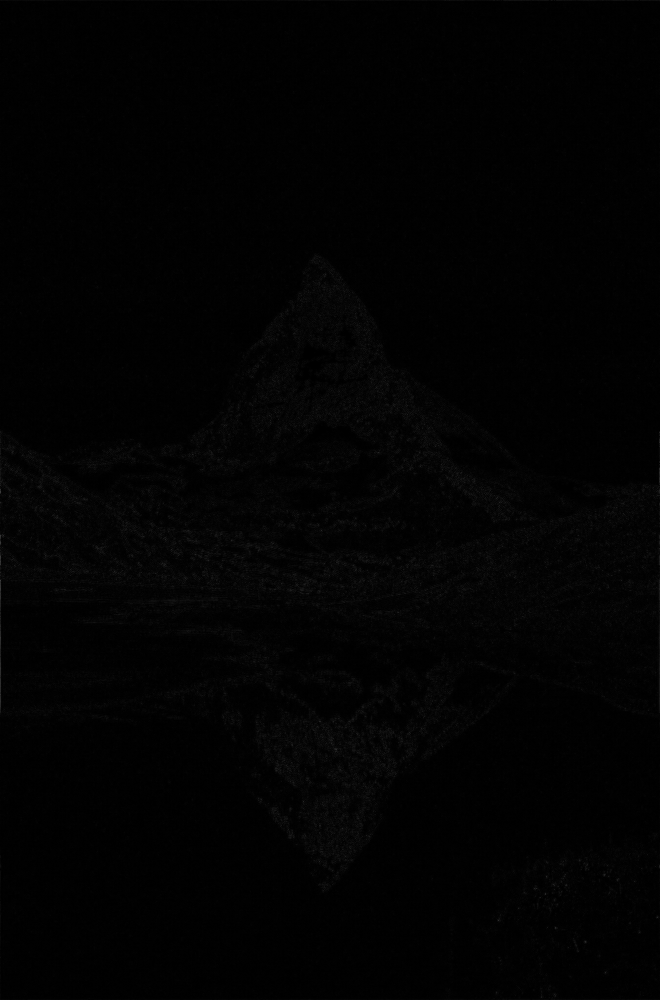

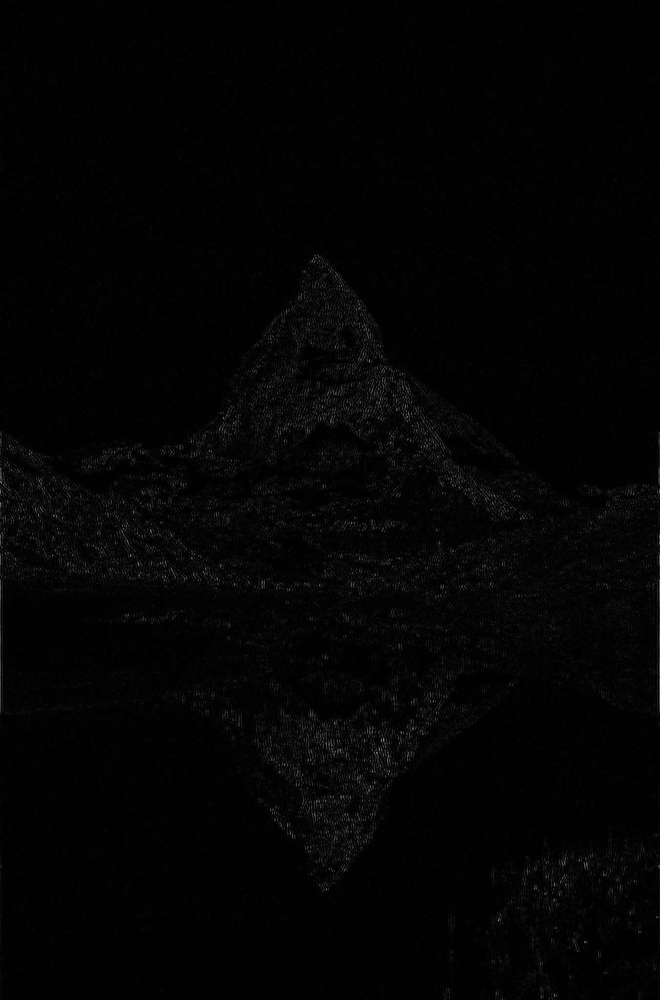

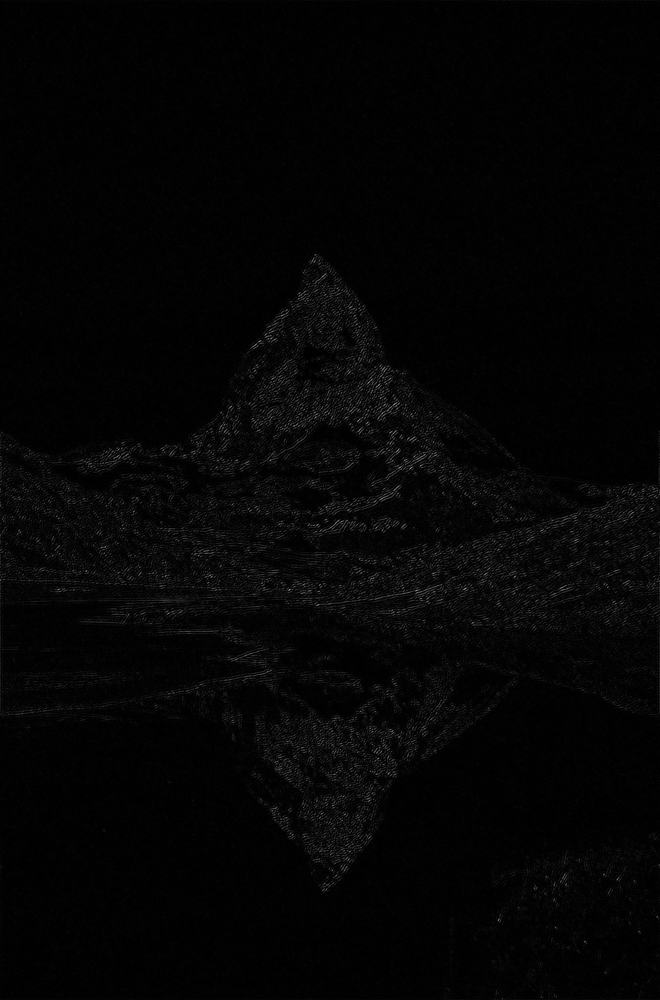

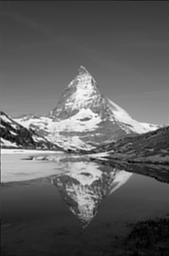

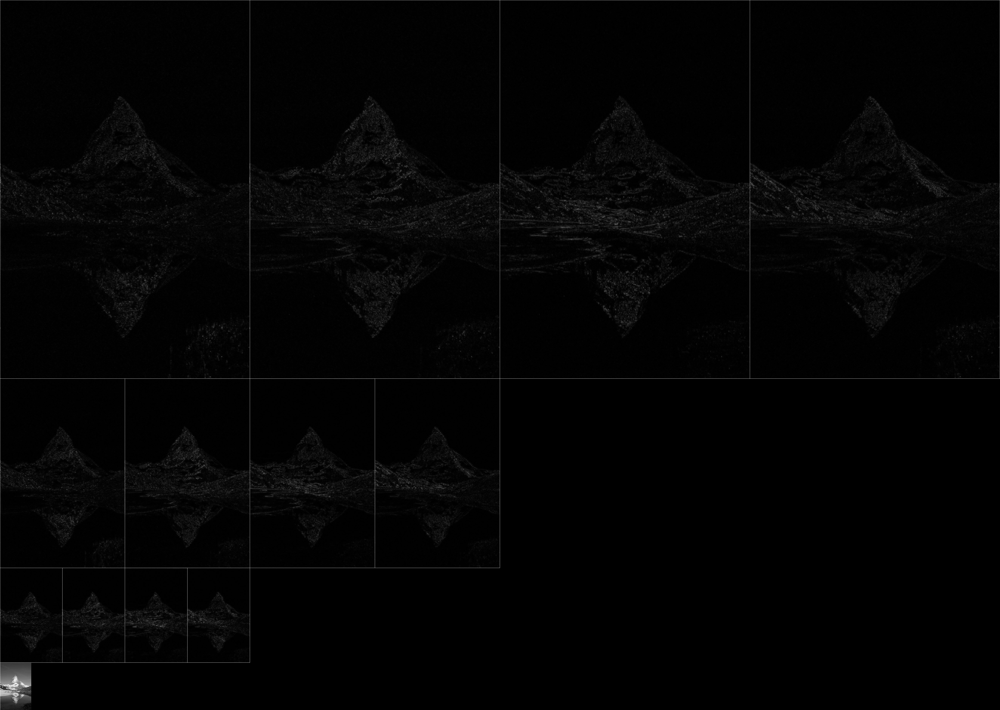

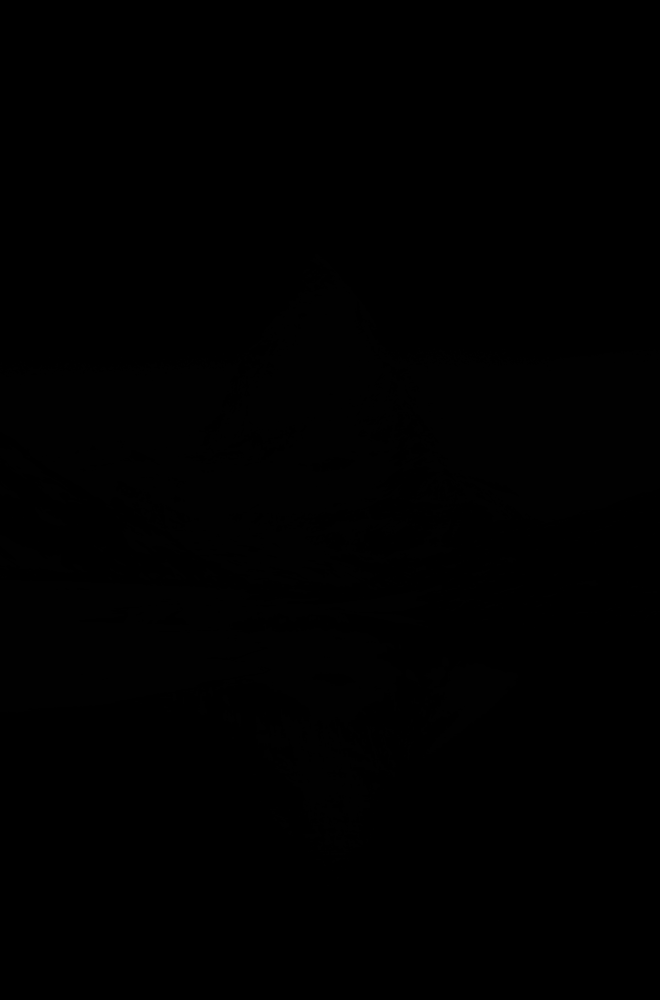

In [2]:
# im = Image.open('data/Rock/Mesh_000000/_Shared/Mesh_000000_HD_BC.tga').convert('L')
im = Image.open('test.jpg').convert('L')
# display(im)

# Build a complex steerable pyramid 
# with height 5 (including lowpass and highpass)
s = Steerable(5)
coeff = s.buildSCFpyr(np.array(im))

# coeff is an array and subbands can be accessed as follows:
# coeff[0] : highpass
# coeff[1][0], coeff[1][1], coeff[1][2], coeff[1][3] : bandpass of scale 1
# coeff[2][0], coeff[2][1], coeff[2][2], coeff[2][3] : bandpass of scale 2
# ...
# coeff[4]: lowpass. It can also be accessed as coeff[-1]
display(Image.fromarray(coeff[0] / coeff[0].max() * 255).convert('L'))
display(Image.fromarray(coeff[1][0].real / coeff[1][0].real.max() * 255).convert('L'))
display(Image.fromarray(coeff[1][1].real / coeff[1][1].real.max() * 255).convert('L'))
display(Image.fromarray(coeff[-1] / coeff[-1].max() * 255).convert('L'))
display(Image.fromarray(visualize(coeff)).convert('L'))

# or visualization of whole decomposition
# reconstruction
out = s.reconSCFpyr(coeff)
display(Image.fromarray(out))

In [4]:
coeff[-1]

array([[ 2598.96355038,  2809.69200497,  2697.67579485, ...,
         2167.98001042,  2449.38669926,  2362.38708549],
       [ 3984.89303542,  3935.66672416,  3793.09441607, ...,
         3956.72552204,  3959.147164  ,  3908.9241567 ],
       [ 3877.59224303,  3843.2396493 ,  3775.26233298, ...,
         3797.2150281 ,  3757.28881954,  3783.79985504],
       ..., 
       [ 1266.76419652,  1672.06083229,  1551.05280708, ...,
          927.79855237,  1083.04303018,  1006.43796815],
       [ 1260.02584911,  1648.21296565,  1502.41913921, ...,
          679.36344649,   947.44268167,   968.76160712],
       [ 1115.19107148,  1580.7478138 ,  1490.37211567, ...,
          268.7271626 ,   658.83044558,   676.25215766]])